In [1]:
import random


from sklearn import datasets
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.linalg as la
import math
from scipy.fftpack import fft,fftfreq
from scipy.linalg import toeplitz
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML, Image
import matplotlib
from matplotlib import rc
rc('animation', html='jshtml')
matplotlib.rcParams['animation.embed_limit'] = 2**128

def csot(X1,Y1,th0,th1,m):
    theta=np.ones(2,)
    theta[0]=th0
    theta[1]=th1
    y_hat=np.dot(X1,theta)
    error=y_hat-Y1
    cost=(1/(2*m))*np.dot(error.T,error)
    return cost

X=pd.core.frame.DataFrame([1,3,6]) #randomly taken x and y , you can use your own csv file.....
Y=pd.core.frame.DataFrame([6,10,16])
X1=X.copy()
meanx=X1.mean()
stdx=X1.std()
X1=np.array(X1)
X1=X1.reshape(len(X1),)

X=np.c_[ np.ones(X.shape[0]),X ]
alpha=0.1
iterations=101
Y=np.array(Y)
Y=Y.reshape(len(Y),)
m = len(Y)
np.random.seed(89)
theta=np.random.rand(2)




oldc=[]
y_hat=np.dot(X,theta)
error=y_hat-Y
cost=(1/(2*m))*np.dot(error.T,error)
oldc.append(cost)
oldtheta=[theta]
for i in range(iterations):
    y_hat=np.dot(X,theta)
    error=y_hat-Y
    cost=(1/(2*m))*np.dot(error.T,error)
    oldc.append(cost)
    theta=theta-(alpha*(1/m)*np.dot(X.T,error))
    oldtheta.append(theta)

theta=oldtheta[-1]

print("theta_0= "+str(theta[0])+"   theta_1= "+str(theta[1]))

oldtheta=np.array(oldtheta)

th0=oldtheta[:,0]# In my case there are only th0 and th1 ,if no.of parameters increases ,dimension of theta increases.....
th1=oldtheta[:,1]
anglesx = th0[1:] - th0[:-1]
anglesy = th1[1:] - th1[:-1]


th=np.linspace(-10,10,100)
x,y=np.meshgrid(th,th)
zs = np.array(  [csot(X, Y,t0,t1,m)
                     for t0, t1 in zip(np.ravel(x), np.ravel(y)) ] )
zs = zs.reshape(x.shape) 

fig, (ax1, ax) = plt.subplots(1, 2)
ax1.contour(x, y, zs, 100, cmap = 'jet')



line1, = ax1.plot([], [], 'r', label = 'Gradient descent', lw = 1.5)
point1, = ax1.plot([], [], '.', color = 'red', markersize = 4)
value_display1 = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)
value_display1.set_animated(True)
ax.set_title('X vs Y')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.scatter(X1, Y, color='red')
line, = ax.plot([], [], lw=2)
annotation = ax.text(0.1, 0.1, '')
annotation.set_animated(True)
def init_1():
    line1.set_data([], [])
    point1.set_data([], [])
    value_display1.set_text('')
    line.set_data([], [])
    annotation.set_text('')
    
    return  line1, point1, value_display1,line, annotation

def animate_1(i):
    
    line1.set_data(th0[:i], th1[:i])
    
    
    point1.set_data(th0[i], th1[i])

    
    value_display1.set_text('cost = %.2f iteration= '%oldc[i]+str(i))
    xq = np.linspace(np.min(X1)-2,np.max(X1)+1,500)
    yq = oldtheta[i][1]*xq + oldtheta[i][0]
    line.set_data(xq, yq)
    annotation.set_text('Cost = %.2f' % (oldc[i]))
    
    return line1, point1, value_display1,line, annotation
  
  

ax1.legend(loc = 1)

anim1 = animation.FuncAnimation(fig, animate_1, init_func=init_1,
                               frames=len(oldc), interval=30, 
                                 blit=True)
plt.close(fig)

theta_0= 3.798250105062286   theta_1= 2.044623271812862


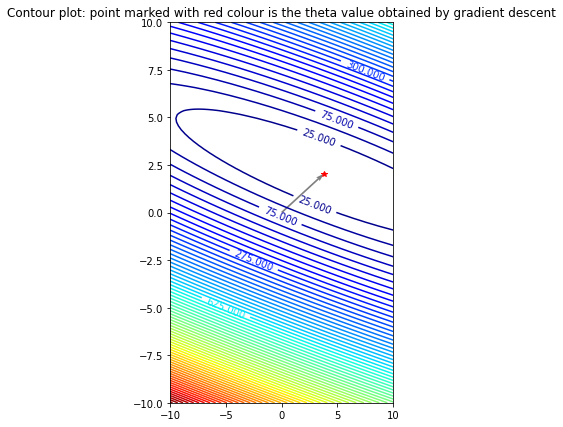

In [2]:
fig1 = plt.figure(figsize = (4,7))
ax2 = plt.axes()
ax2.set_title("Contour plot: point marked with red colour is the theta value obtained by gradient descent")
manual_locations = [(0, 0), (2.5, 2.5),  
                    (-2.5, -2.5), (5,5),  
                    (-5, -5), (7.5, 7.5),(4,2)] 
c=ax2.contour(x, y, zs, 70, cmap = 'jet')
plt.clabel(c, inline=True, fontsize=10, manual=manual_locations)
ax2.quiver(oldtheta[-1][0], oldtheta[-1][1],  scale_units = 'xy', angles = 'xy', scale = 1, color = 'black', alpha = .5)
plt.plot(oldtheta[-1][0], oldtheta[-1][1], 'r*')



In [3]:
anim1